# TOV EVOLUTION: K

### 1. Perturbation

In [1]:
import matplotlib.pyplot as plt
import numpy as np

import kuibit.cactus_scalars as cs
import kuibit.simdir as sd

from kuibit import grid_data as gd

from IPython.display import HTML
import matplotlib.animation as animation

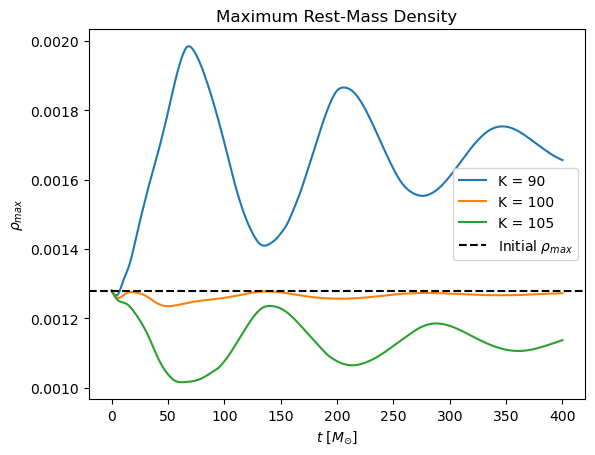

In [2]:
filenames = ["./TOV_K_90/", './TOV_example_original/', "./TOV_K_105/"]
K = [90, 100, 105]
for filename, kappa in zip(filenames, K):
    sim = sd.SimDir(filename)
    timeseries = sim.timeseries
    rho_max = timeseries.maximum.fields.rho
    plt.plot(rho_max, label=r"K = " + str(kappa))

plt.axhline(rho_max.values[0], linestyle = '--', color = 'black', label = r'Initial $\rho_{max}$')
plt.xlabel(r'$t$ [$M_{\odot}$]')
plt.ylabel(r'$\rho_{max}$')
plt.legend()
plt.title('Maximum Rest-Mass Density')
plt.savefig('density K.png', dpi = 300)
plt.show()

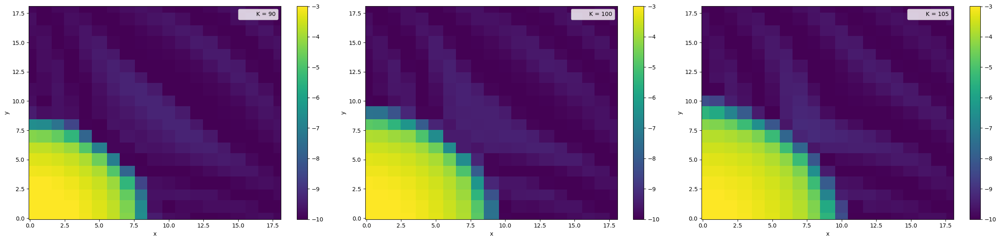

In [3]:
i = 0
import matplotlib.patches as mpatches
import matplotlib.lines as mlines

fig = plt.figure(figsize = (25, 6))
for filename, kappa in zip(filenames, K):  
    sim = sd.SimDir(filename)
    ax = fig.add_subplot(130+int(i+1))
    gf = sim.gf
    vars2D = gf.xy
    rho = vars2D.fields.rho
    small_grid = gd.UniformGrid([100, 100], x0=[0, 0], x1=[18,18]) #lower left, upper right coordinates
    rho_small = rho.read_on_grid(rho.iterations[-1], small_grid)
    cf = ax.pcolormesh(*rho_small.coordinates_meshgrid(), np.log10(rho_small.data_xyz), vmin=-10, vmax=-3)
    plt.colorbar(cf)
    plt.xlabel('x')
    plt.ylabel('y')
    i = i+1
    legend_patch = mpatches.Patch(color = 'none', label=r'K = '+str(kappa))
    ax.legend(handles=[legend_patch])

plt.tight_layout()
plt.savefig('grid K.png', dpi = 300)
plt.show()

In [4]:
sim_90 = sd.SimDir(filenames[0])
ax_90 = fig.add_subplot(131)
gf_90 = sim_90.gf
vars2D_90 = gf_90.xy
rho_90 = vars2D_90.fields.rho

sim_100 = sd.SimDir(filenames[1])
ax_100 = fig.add_subplot(133)
gf_100 = sim_100.gf
vars2D_100 = gf_100.xy
rho_100 = vars2D_100.fields.rho

sim_105 = sd.SimDir(filenames[2])
ax_105 = fig.add_subplot(132)
gf_105 = sim_105.gf
vars2D_105 = gf_105.xy
rho_105 = vars2D_105.fields.rho

fig, (ax_90, ax_100, ax_105) = plt.subplots(1, 3, figsize=(15, 5))
ims = []

ax_90.set_xlabel(r'$x (M_\odot)$')
ax_90.set_ylabel(r'$y (M_\odot)$')
ax_90.set_aspect('equal')
ax_100.set_xlabel(r'$x (M_\odot)$')
ax_100.set_ylabel(r'$y (M_\odot)$')
ax_100.set_aspect('equal')
ax_105.set_xlabel(r'$x (M_\odot)$')
ax_105.set_ylabel(r'$y (M_\odot)$')
ax_105.set_aspect('equal')


title_90 = ax_90.text(0.5, 1.05, f'K = 90', size=plt.rcParams["axes.titlesize"], ha="center", transform=ax_90.transAxes)
title_100 = ax_100.text(0.5, 1.05, f'K = 100', size=plt.rcParams["axes.titlesize"], ha="center", transform=ax_100.transAxes)
title_105 = ax_105.text(0.5, 1.05,f'K = 105',size=plt.rcParams["axes.titlesize"], ha="center",transform=ax_105.transAxes)

for i in rho.iterations[0::1]:
    rho_small_90 = rho_90.read_on_grid(i, small_grid)
    rho_small_100 = rho_100.read_on_grid(i, small_grid)
    rho_small_105 = rho_105.read_on_grid(i, small_grid)

    suptitle = ax_100.text(0.5, 1.15, f'Time = {rho.available_times[i//2048]}',
                            size=plt.rcParams["axes.titlesize"], ha="center",
                            transform=ax_100.transAxes, animated=True)
    
    im_90 = ax_90.pcolormesh(*rho_small_90.coordinates_meshgrid(), np.log10(rho_small_90.data_xyz), animated=True, vmin=-10, vmax=-3)
    im_100 = ax_100.pcolormesh(*rho_small_100.coordinates_meshgrid(), np.log10(rho_small_100.data_xyz), animated=True, vmin=-10, vmax=-3)
    im_105 = ax_105.pcolormesh(*rho_small_105.coordinates_meshgrid(), np.log10(rho_small_105.data_xyz), animated=True, vmin=-10, vmax=-3)

    ims.append([im_90, im_100, im_105, title_90, title_100, title_105, suptitle])
    plt.close()    

ani = animation.ArtistAnimation(fig, ims, interval=50, blit=False, repeat_delay=1000)
HTML(ani.to_jshtml())

In [5]:
ani.save("TOV_evolution_K.gif", writer='pillow',fps=60)

### 2. Resolution vs Perturbation

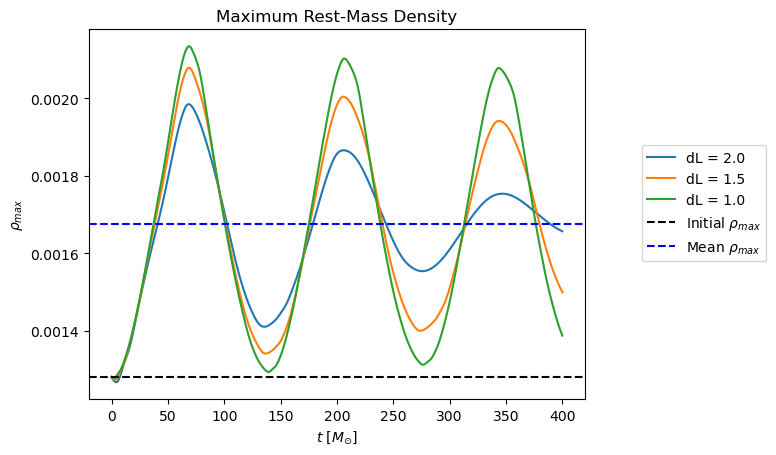

In [6]:
filenames = ["./TOV_K_90/", './TOV_K_90_res_1_5/', "./TOV_K_90_res_1_0/"]
dL = [2.0, 1.5, 1.0]
for filename, length in zip(filenames, dL):
    sim = sd.SimDir(filename)
    timeseries = sim.timeseries
    rho_max = timeseries.maximum.fields.rho
    plt.plot(rho_max, label=r"dL = " + str(length))

plt.axhline(rho_max.values[0], linestyle = '--', color = 'black', label = r'Initial $\rho_{max}$')
plt.axhline(np.mean(rho_max.values), linestyle = '--', color = 'blue', label = r'Mean $\rho_{max}$')
plt.xlabel(r'$t$ [$M_{\odot}$]')
plt.ylabel(r'$\rho_{max}$')
plt.legend(bbox_to_anchor = (1.1, 0.705))
plt.title('Maximum Rest-Mass Density')
plt.savefig('density K 90 res.png', dpi = 300, bbox_inches="tight")
plt.show()

In [7]:
sim_2 = sd.SimDir(filenames[0])
ax_2 = fig.add_subplot(131)
gf_2 = sim_2.gf
vars2D_2 = gf_2.xy
rho_2 = vars2D_2.fields.rho

sim_15 = sd.SimDir(filenames[1])
ax_15 = fig.add_subplot(133)
gf_15 = sim_15.gf
vars2D_15 = gf_15.xy
rho_15 = vars2D_15.fields.rho

sim_1 = sd.SimDir(filenames[2])
ax_1 = fig.add_subplot(132)
gf_1 = sim_1.gf
vars2D_1 = gf_1.xy
rho_1 = vars2D_1.fields.rho

Note: in this case, the different resolutions mean that each simulation has a different number of iterations.
Therefore, it is necessary to consider this when creating the gif, before confronting grids at different times.

Specifically, since the steps in time are respectively $2.0$, $1.5$, $1.0$, I select in the for loops the points in order to consider only those that are taken at the same timestep. This selection can be seen in the for loop with `rho_2.iterations[::3]`, `rho_15.iterations[::4]`, `rho_1.iterations[::6]`. We can see that the effectiveness of the selection from the following cell:

In [8]:
print(rho_1.available_times[::6])
print(rho_15.available_times[::4])
print(rho_2.available_times[::3])

print(len(rho_1.available_times[::6]), len(rho_15.available_times[::4]), len(rho_2.available_times[::3]))

[0.0, 6.0, 12.0, 18.0, 24.0, 30.0, 36.0, 42.0, 48.0, 54.0, 60.0, 66.0, 72.0, 78.0, 84.0, 90.0, 96.0, 102.0, 108.0, 114.0, 120.0, 126.0, 132.0, 138.0, 144.0, 150.0, 156.0, 162.0, 168.0, 174.0, 180.0, 186.0, 192.0, 198.0, 204.0, 210.0, 216.0, 222.0, 228.0, 234.0, 240.0, 246.0, 252.0, 258.0, 264.0, 270.0, 276.0, 282.0, 288.0, 294.0, 300.0, 306.0, 312.0, 318.0, 324.0, 330.0, 336.0, 342.0, 348.0, 354.0, 360.0, 366.0, 372.0, 378.0, 384.0, 390.0, 396.0]
[0.0, 6.0, 12.0, 18.0, 24.0, 30.0, 36.0, 42.0, 48.0, 54.0, 60.0, 66.0, 72.0, 78.0, 84.0, 90.0, 96.0, 102.0, 108.0, 114.0, 120.0, 126.0, 132.0, 138.0, 144.0, 150.0, 156.0, 162.0, 168.0, 174.0, 180.0, 186.0, 192.0, 198.0, 204.0, 210.0, 216.0, 222.0, 228.0, 234.0, 240.0, 246.0, 252.0, 258.0, 264.0, 270.0, 276.0, 282.0, 288.0, 294.0, 300.0, 306.0, 312.0, 318.0, 324.0, 330.0, 336.0, 342.0, 348.0, 354.0, 360.0, 366.0, 372.0, 378.0, 384.0, 390.0, 396.0]
[0.0, 6.0, 12.0, 18.0, 24.0, 30.0, 36.0, 42.0, 48.0, 54.0, 60.0, 66.0, 72.0, 78.0, 84.0, 90.0, 96.

As we can see, this method (selecting every third -`[::3]`-, fourth -`[::4]`-, and sixth iteration -`[::6]`- respectively) allows us to select only the points taken at the same time for all the simulations.

In [9]:
fig, (ax_2, ax_15, ax_1) = plt.subplots(1, 3, figsize=(15, 5))
ims = []

ax_2.set_xlabel(r'$x (M_\odot)$')
ax_2.set_ylabel(r'$y (M_\odot)$')
ax_2.set_aspect('equal')
ax_15.set_xlabel(r'$x (M_\odot)$')
ax_15.set_ylabel(r'$y (M_\odot)$')
ax_15.set_aspect('equal')
ax_1.set_xlabel(r'$x (M_\odot)$')
ax_1.set_ylabel(r'$y (M_\odot)$')
ax_1.set_aspect('equal')


title_2 = ax_2.text(0.5, 1.05, f'dL = 2.0', size=plt.rcParams["axes.titlesize"], ha="center", transform=ax_2.transAxes)
title_15 = ax_15.text(0.5, 1.05, f'dL = 1.5', size=plt.rcParams["axes.titlesize"], ha="center", transform=ax_15.transAxes)
title_1 = ax_1.text(0.5, 1.05,f'dL = 1.0',size=plt.rcParams["axes.titlesize"], ha="center",transform=ax_1.transAxes)

#need to use different indexes because different resolution means different number of iterations
#this way I select the same times for all the simulations
for i, j, k in zip(rho_2.iterations[::3], rho_15.iterations[::4], rho_1.iterations[::6]):
    rho_small_2 = rho_2.read_on_grid(i, small_grid)
    rho_small_15 = rho_15.read_on_grid(j, small_grid)
    rho_small_1 = rho_1.read_on_grid(k, small_grid)

    suptitle = ax_15.text(0.5, 1.15, f'Time = {rho.available_times[i//2048]}',
                            size=plt.rcParams["axes.titlesize"], ha="center",
                            transform=ax_15.transAxes, animated=True)
    
    im_2 = ax_2.pcolormesh(*rho_small_2.coordinates_meshgrid(), np.log10(rho_small_2.data_xyz), animated=True, vmin=-10, vmax=-3)
    im_15 = ax_15.pcolormesh(*rho_small_15.coordinates_meshgrid(), np.log10(rho_small_15.data_xyz), animated=True, vmin=-10, vmax=-3)
    im_1 = ax_1.pcolormesh(*rho_small_1.coordinates_meshgrid(), np.log10(rho_small_1.data_xyz), animated=True, vmin=-10, vmax=-3)

    ims.append([im_2, im_15, im_1, title_2, title_15, title_1, suptitle])
    plt.close()    

ani = animation.ArtistAnimation(fig, ims, interval=100, blit=False, repeat_delay=1000)
HTML(ani.to_jshtml())

In [10]:
ani.save("TOV_evolution_K_90_res.gif", writer='pillow',fps=60)

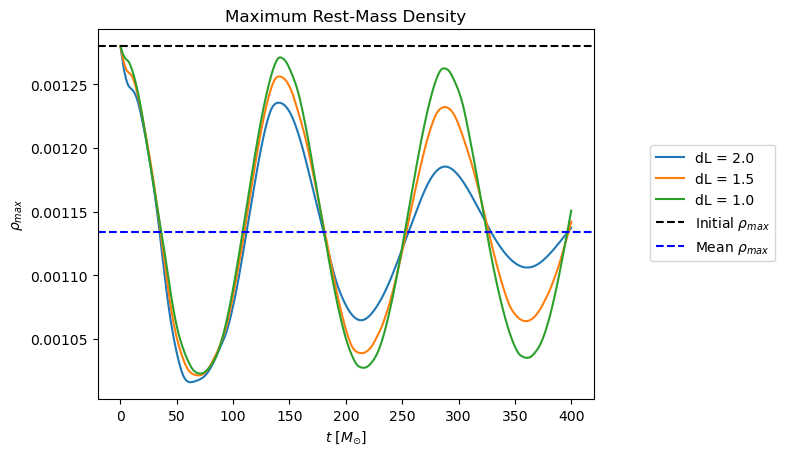

In [11]:
filenames = ["./TOV_K_105/", './TOV_K_105_res_1_5/', "./TOV_K_105_res_1_0/"]
dL = [2.0, 1.5, 1.0]
for filename, length in zip(filenames, dL):
    sim = sd.SimDir(filename)
    timeseries = sim.timeseries
    rho_max = timeseries.maximum.fields.rho
    plt.plot(rho_max, label=r"dL = " + str(length))

plt.axhline(rho_max.values[0], linestyle = '--', color = 'black', label = r'Initial $\rho_{max}$')
plt.axhline(np.mean(rho_max.values), linestyle = '--', color = 'blue', label = r'Mean $\rho_{max}$')
plt.xlabel(r'$t$ [$M_{\odot}$]')
plt.ylabel(r'$\rho_{max}$')
plt.legend(bbox_to_anchor = (1.1, 0.705))
plt.title('Maximum Rest-Mass Density')
plt.savefig('density K 105 res.png', dpi = 300, bbox_inches="tight")
plt.show()

In [12]:
sim_2 = sd.SimDir(filenames[0])
ax_2 = fig.add_subplot(131)
gf_2 = sim_2.gf
vars2D_2 = gf_2.xy
rho_2 = vars2D_2.fields.rho

sim_15 = sd.SimDir(filenames[1])
ax_15 = fig.add_subplot(133)
gf_15 = sim_15.gf
vars2D_15 = gf_15.xy
rho_15 = vars2D_15.fields.rho

sim_1 = sd.SimDir(filenames[2])
ax_1 = fig.add_subplot(132)
gf_1 = sim_1.gf
vars2D_1 = gf_1.xy
rho_1 = vars2D_1.fields.rho

fig, (ax_2, ax_15, ax_1) = plt.subplots(1, 3, figsize=(15, 5))
ims = []

ax_2.set_xlabel(r'$x (M_\odot)$')
ax_2.set_ylabel(r'$y (M_\odot)$')
ax_2.set_aspect('equal')
ax_15.set_xlabel(r'$x (M_\odot)$')
ax_15.set_ylabel(r'$y (M_\odot)$')
ax_15.set_aspect('equal')
ax_1.set_xlabel(r'$x (M_\odot)$')
ax_1.set_ylabel(r'$y (M_\odot)$')
ax_1.set_aspect('equal')


title_2 = ax_2.text(0.5, 1.05, f'dL = 2.0', size=plt.rcParams["axes.titlesize"], ha="center", transform=ax_2.transAxes)
title_15 = ax_15.text(0.5, 1.05, f'dL = 1.5', size=plt.rcParams["axes.titlesize"], ha="center", transform=ax_15.transAxes)
title_1 = ax_1.text(0.5, 1.05,f'dL = 1.0',size=plt.rcParams["axes.titlesize"], ha="center",transform=ax_1.transAxes)

#need to use different indexes because different resolution means different number of iterations
#this way I select the same times for all the simulations
for i, j, k in zip(rho_2.iterations[::3], rho_15.iterations[::4], rho_1.iterations[::6]):
    rho_small_2 = rho_2.read_on_grid(i, small_grid)
    rho_small_15 = rho_15.read_on_grid(j, small_grid)
    rho_small_1 = rho_1.read_on_grid(k, small_grid)

    suptitle = ax_15.text(0.5, 1.15, f'Time = {rho.available_times[i//2048]}',
                            size=plt.rcParams["axes.titlesize"], ha="center",
                            transform=ax_15.transAxes, animated=True)
    
    im_2 = ax_2.pcolormesh(*rho_small_2.coordinates_meshgrid(), np.log10(rho_small_2.data_xyz), animated=True, vmin=-10, vmax=-3)
    im_15 = ax_15.pcolormesh(*rho_small_15.coordinates_meshgrid(), np.log10(rho_small_15.data_xyz), animated=True, vmin=-10, vmax=-3)
    im_1 = ax_1.pcolormesh(*rho_small_1.coordinates_meshgrid(), np.log10(rho_small_1.data_xyz), animated=True, vmin=-10, vmax=-3)

    ims.append([im_2, im_15, im_1, title_2, title_15, title_1, suptitle])
    plt.close()    

ani = animation.ArtistAnimation(fig, ims, interval=100, blit=False, repeat_delay=1000)
HTML(ani.to_jshtml())

In [13]:
ani.save("TOV_evolution_K_105_res.gif", writer='pillow',fps=60)